In [1]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
import math
df = pd.read_csv("C:\\Users\\User\\OneDrive\\Documents\diabetes_binary_5050split_health_indicators_BRFSS2015.csv")

In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,StandardScaler,MinMaxScaler,PowerTransformer,FunctionTransformer
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import confusion_matrix,classification_report,ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression,RidgeClassifier,LassoCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, plot_confusion_matrix


In [3]:
#load the dataset
df=pd.read_csv("diabetes_binary_5050split_health_indicators_BRFSS2015.csv")
df.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0


In [4]:
#check the rows and columns number.
print(f"number of rows:--> {df.shape[0]} and number of columns:--> {df.shape[1]}")

number of rows:--> 70692 and number of columns:--> 22


In [5]:
df.shape

(70692, 22)

In [6]:
#chack the data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70692 entries, 0 to 70691
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       70692 non-null  float64
 1   HighBP                70692 non-null  float64
 2   HighChol              70692 non-null  float64
 3   CholCheck             70692 non-null  float64
 4   BMI                   70692 non-null  float64
 5   Smoker                70692 non-null  float64
 6   Stroke                70692 non-null  float64
 7   HeartDiseaseorAttack  70692 non-null  float64
 8   PhysActivity          70692 non-null  float64
 9   Fruits                70692 non-null  float64
 10  Veggies               70692 non-null  float64
 11  HvyAlcoholConsump     70692 non-null  float64
 12  AnyHealthcare         70692 non-null  float64
 13  NoDocbcCost           70692 non-null  float64
 14  GenHlth               70692 non-null  float64
 15  MentHlth           

In [7]:
#check for missing numbers
def checking_m(df):
    null_v = df.isnull().sum().sort_values(ascending=False)
    null_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    null_v = pd.concat([null_v, null_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return null_v

checking_m(df)

,Missing_Number,Missing_Percent
Diabetes_binary,0,0.0
HighBP,0,0.0
Education,0,0.0
Age,0,0.0
Sex,0,0.0
DiffWalk,0,0.0
PhysHlth,0,0.0
MentHlth,0,0.0
GenHlth,0,0.0
NoDocbcCost,0,0.0


In [8]:
#check for dublicated rows
print("Numbers of duplicated rows :",df.duplicated().sum())

Numbers of duplicated rows : 1635


In [9]:
#dropping the duplicated rows 
df=df.drop_duplicates(keep="first")
print("After removing,now number of duplicated rows are:",df.duplicated().sum())

After removing,now number of duplicated rows are: 0


In [10]:
#check data description
df.describe().T.style.bar(subset=['mean'], color='#205ff2').background_gradient(subset=['std'], cmap='mako').background_gradient(subset=['50%'], cmap='coolwarm')

,count,mean,std,min,25%,50%,75%,max
Diabetes_binary,69057.000000,0.508232,0.499936,0.000000,0.000000,1.000000,1.000000,1.000000
HighBP,69057.000000,0.571224,0.494905,0.000000,0.000000,1.000000,1.000000,1.000000
HighChol,69057.000000,0.531329,0.499021,0.000000,0.000000,1.000000,1.000000,1.000000
CholCheck,69057.000000,0.974803,0.156723,0.000000,1.000000,1.000000,1.000000,1.000000
BMI,69057.000000,29.955834,7.147972,12.000000,25.000000,29.000000,33.000000,98.000000
Smoker,69057.000000,0.481935,0.499677,0.000000,0.000000,0.000000,1.000000,1.000000
Stroke,69057.000000,0.063643,0.244118,0.000000,0.000000,0.000000,0.000000,1.000000
HeartDiseaseorAttack,69057.000000,0.150875,0.357930,0.000000,0.000000,0.000000,0.000000,1.000000
PhysActivity,69057.000000,0.696483,0.459780,0.000000,0.000000,1.000000,1.000000,1.000000
Fruits,69057.000000,0.605659,0.488712,0.000000,0.000000,1.000000,1.000000,1.000000


In [11]:
#check the correlation between terget and each of columns
df.corr()["Diabetes_binary"]

Diabetes_binary         1.000000
HighBP                  0.372048
HighChol                0.281399
CholCheck               0.118900
BMI                     0.285643
Smoker                  0.075853
Stroke                  0.122727
HeartDiseaseorAttack    0.207229
PhysActivity           -0.150281
Fruits                 -0.044560
Veggies                -0.072181
HvyAlcoholConsump      -0.098709
AnyHealthcare           0.027034
NoDocbcCost             0.036145
GenHlth                 0.396571
MentHlth                0.080688
PhysHlth                0.206868
DiffWalk                0.267082
Sex                     0.042538
Age                     0.274550
Education              -0.158522
Income                 -0.212846
Name: Diabetes_binary, dtype: float64

<AxesSubplot:>

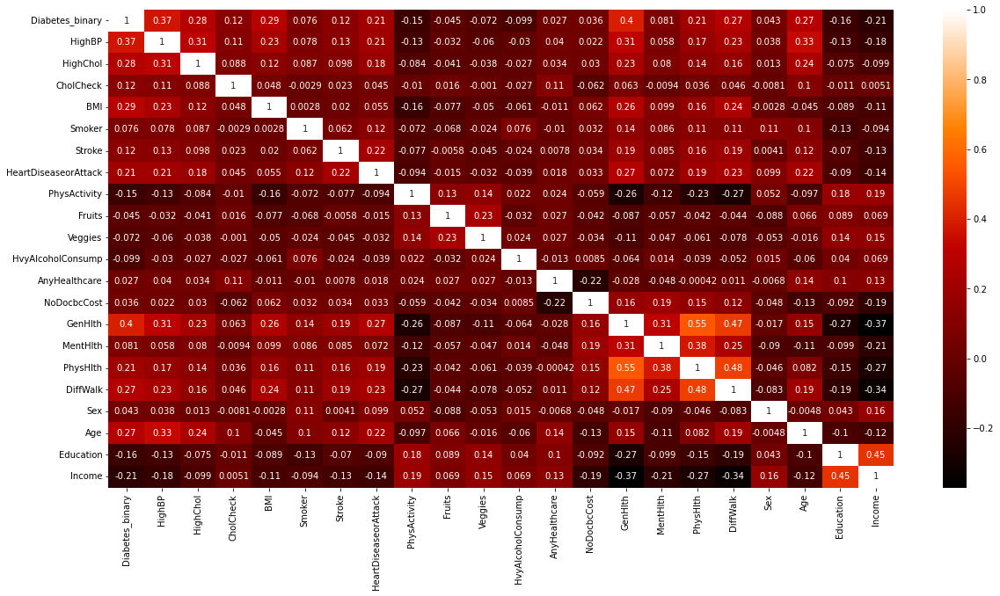

In [12]:
plt.figure(figsize=(20,10))

#plot heat map
sns.heatmap(df.corr(),annot=True,cmap="gist_heat")

In [13]:
df.Diabetes_binary.value_counts()

1.0    35097
0.0    33960
Name: Diabetes_binary, dtype: int64

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Diabetes_binary', ylabel='count'>

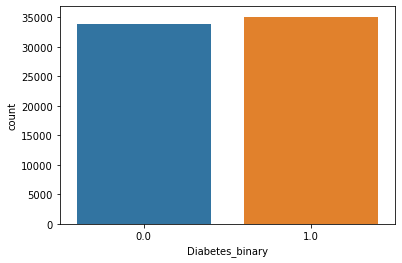

In [14]:
sns.countplot(df.Diabetes_binary)

In [15]:
X=df.drop("Diabetes_binary",axis=1)
y=df.Diabetes_binary

In [16]:
df.shape

(69057, 22)

In [17]:
df.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0


In [18]:
# separating the data and labels
X = df.drop(columns = 'Diabetes_binary', axis=1)
Y = df['Diabetes_binary']

In [19]:
df.shape

(69057, 22)

In [20]:
print(X)

       HighBP  HighChol  CholCheck   BMI  Smoker  Stroke  \
0         1.0       0.0        1.0  26.0     0.0     0.0   
1         1.0       1.0        1.0  26.0     1.0     1.0   
2         0.0       0.0        1.0  26.0     0.0     0.0   
3         1.0       1.0        1.0  28.0     1.0     0.0   
4         0.0       0.0        1.0  29.0     1.0     0.0   
...       ...       ...        ...   ...     ...     ...   
70687     0.0       1.0        1.0  37.0     0.0     0.0   
70688     0.0       1.0        1.0  29.0     1.0     0.0   
70689     1.0       1.0        1.0  25.0     0.0     0.0   
70690     1.0       1.0        1.0  18.0     0.0     0.0   
70691     1.0       1.0        1.0  25.0     0.0     0.0   

       HeartDiseaseorAttack  PhysActivity  Fruits  Veggies  ...  \
0                       0.0           1.0     0.0      1.0  ...   
1                       0.0           0.0     1.0      0.0  ...   
2                       0.0           1.0     1.0      1.0  ...   
3          

In [21]:
print(Y)

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
70687    1.0
70688    1.0
70689    1.0
70690    1.0
70691    1.0
Name: Diabetes_binary, Length: 69057, dtype: float64


In [22]:
#It is a good practise to split the data to avoiding the data leakage 
#train test split  
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.2,random_state=42)
print("X_train shape: ",x_train.shape)
print("X_test shape: ",x_test.shape)
print("Y_train shape: ",y_train.shape)
print("Y_test shape: ",y_test.shape)

X_train shape:  (55245, 21)
X_test shape:  (13812, 21)
Y_train shape:  (55245,)
Y_test shape:  (13812,)


# Normalization

In [23]:
from sklearn.preprocessing import StandardScaler
std=StandardScaler()

In [24]:
x_train=std.fit_transform(x_train)
x_test=std.transform(x_test)

In [25]:
x_train

array([[-1.15446282,  0.93912842,  0.16089202, ...,  0.48773474,
         0.09997527,  0.62064079],
       [ 0.86620373, -1.0648171 ,  0.16089202, ...,  1.53531866,
         1.07099034,  0.62064079],
       [ 0.86620373,  0.93912842,  0.16089202, ..., -0.21065453,
        -0.8710398 , -1.22167291],
       ...,
       [ 0.86620373,  0.93912842,  0.16089202, ...,  1.18612402,
        -1.84205487, -1.22167291],
       [-1.15446282, -1.0648171 ,  0.16089202, ..., -0.55984917,
        -0.8710398 , -1.22167291],
       [-1.15446282, -1.0648171 ,  0.16089202, ..., -1.60743309,
         1.07099034,  1.08121921]])

In [26]:
x_test

array([[ 0.86620373,  0.93912842,  0.16089202, ...,  0.48773474,
         1.07099034,  1.08121921],
       [ 0.86620373,  0.93912842,  0.16089202, ..., -1.60743309,
         1.07099034,  1.08121921],
       [ 0.86620373,  0.93912842,  0.16089202, ...,  1.53531866,
        -0.8710398 ,  0.16006236],
       ...,
       [ 0.86620373,  0.93912842,  0.16089202, ...,  0.83692938,
        -1.84205487,  0.62064079],
       [-1.15446282, -1.0648171 ,  0.16089202, ..., -2.65501701,
        -0.8710398 , -1.22167291],
       [-1.15446282, -1.0648171 ,  0.16089202, ..., -1.25823845,
         1.07099034,  1.08121921]])

# Machine Learning

In [27]:
import time
start_time=time.time()
lr=LogisticRegression()
lr.fit(x_train, y_train)
end_time=time.time()

y_pred=lr.predict(x_test) 

#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")



Training time: 0.15798187255859375 Seconds
Accuracy :--->> 0.7511584129742254

              precision    recall  f1-score   support

         0.0       0.75      0.73      0.74      6723
         1.0       0.75      0.77      0.76      7089

    accuracy                           0.75     13812
   macro avg       0.75      0.75      0.75     13812
weighted avg       0.75      0.75      0.75     13812

Confusion matrix:--->>
 [[4891 1832]
 [1605 5484]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

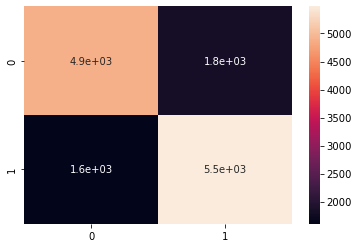

In [28]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

In [31]:
#training accuracy
start_time=time.time()
rf=RandomForestClassifier()
rf.fit(x_train, y_train)
end_time=time.time()

y_pred=rf.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Training time: 12.275844097137451 Seconds
Accuracy :--->> 0.7398638864755285

              precision    recall  f1-score   support

         0.0       0.75      0.70      0.72      6723
         1.0       0.73      0.78      0.75      7089

    accuracy                           0.74     13812
   macro avg       0.74      0.74      0.74     13812
weighted avg       0.74      0.74      0.74     13812

Confusion matrix:--->>
 [[4719 2004]
 [1589 5500]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

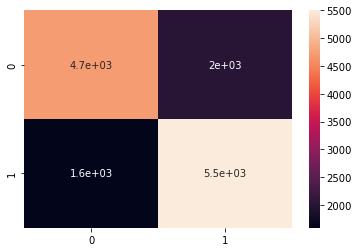

In [32]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

In [32]:
#training accuracy
start_time=time.time()
dt=DecisionTreeClassifier()
dt.fit(x_train, y_train)
y_pred=dt.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Accuracy :--->> 0.6496524761077324

              precision    recall  f1-score   support

         0.0       0.64      0.66      0.65      6723
         1.0       0.66      0.64      0.65      7089

    accuracy                           0.65     13812
   macro avg       0.65      0.65      0.65     13812
weighted avg       0.65      0.65      0.65     13812

Confusion matrix:--->>
 [[4410 2313]
 [2526 4563]]

<<<<------------------------------------------------------------->>>>



In [33]:
#training accuracy
start_time=time.time()
ab=AdaBoostClassifier()
ab.fit(x_train, y_train)
end_time=time.time()
y_pred=ab.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Training time: 4.041794300079346 Seconds
Accuracy :--->> 0.7549956559513467

              precision    recall  f1-score   support

         0.0       0.76      0.73      0.74      6723
         1.0       0.75      0.78      0.77      7089

    accuracy                           0.75     13812
   macro avg       0.76      0.75      0.75     13812
weighted avg       0.76      0.75      0.75     13812

Confusion matrix:--->>
 [[4918 1805]
 [1579 5510]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

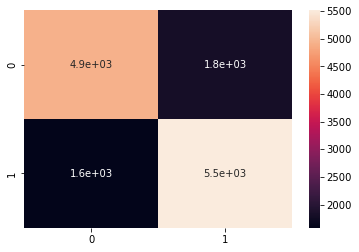

In [35]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)


In [36]:
#training accuracy
start_time=time.time()
xgb=XGBClassifier(learning_rate=0.1,n_estimators=50)
xgb.fit(x_train, y_train)
end_time=time.time()
y_pred=xgb.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Training time: 1.9572508335113525 Seconds
Accuracy :--->> 0.7557920648711266

              precision    recall  f1-score   support

         0.0       0.77      0.71      0.74      6723
         1.0       0.74      0.80      0.77      7089

    accuracy                           0.76     13812
   macro avg       0.76      0.75      0.75     13812
weighted avg       0.76      0.76      0.76     13812

Confusion matrix:--->>
 [[4766 1957]
 [1416 5673]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

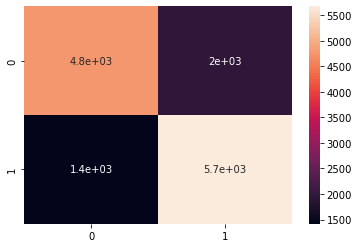

In [37]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

In [39]:
#training accuracy
start_time=time.time()
gnb=GaussianNB()
gnb.fit(x_train, y_train)
end_time=time.time()
y_pred=gnb.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")

Training time: 0.06607532501220703 Seconds
Accuracy :--->> 0.723573704025485

              precision    recall  f1-score   support

         0.0       0.71      0.73      0.72      6723
         1.0       0.74      0.72      0.73      7089

    accuracy                           0.72     13812
   macro avg       0.72      0.72      0.72     13812
weighted avg       0.72      0.72      0.72     13812

Confusion matrix:--->>
 [[4915 1808]
 [2010 5079]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

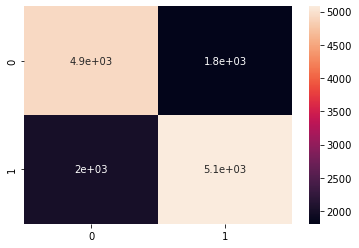

In [40]:
# calculating and plotting the confusion matrix
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

Training time: 0.022520780563354492 Seconds
Accuracy :--->> 0.7138719953663482

              precision    recall  f1-score   support

         0.0       0.71      0.69      0.70      6723
         1.0       0.71      0.74      0.73      7089

    accuracy                           0.71     13812
   macro avg       0.71      0.71      0.71     13812
weighted avg       0.71      0.71      0.71     13812

Confusion matrix:--->>
 [[4633 2090]
 [1862 5227]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

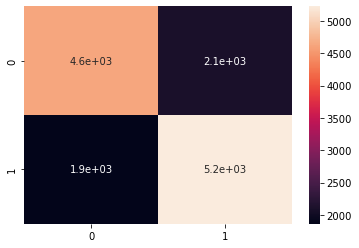

In [41]:
start_time=time.time()
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)
end_time=time.time()
y_pred=knn.predict(x_test) 
#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

Training time: 0.022520780563354492 Seconds
Accuracy :--->> 0.723573704025485

              precision    recall  f1-score   support

         0.0       0.71      0.73      0.72      6723
         1.0       0.74      0.72      0.73      7089

    accuracy                           0.72     13812
   macro avg       0.72      0.72      0.72     13812
weighted avg       0.72      0.72      0.72     13812

Confusion matrix:--->>
 [[4915 1808]
 [2010 5079]]

<<<<------------------------------------------------------------->>>>



<AxesSubplot:>

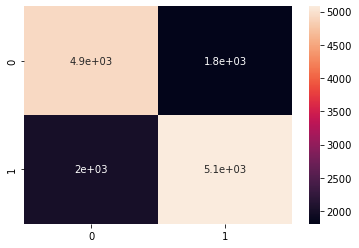

In [45]:
from sklearn.ensemble import GradientBoostingClassifier

grad_boost_clf = GradientBoostingClassifier(n_estimators=100, random_state=42)
grad_boost_clf.fit(x_train, y_train)
#evaluate(grad_boost_clf, X_train, X_test, y_train, y_test)
y_pred=gnb.predict(x_test)
#printing the model name and accuracy !!!!!
print("Training time:",end_time-start_time,"Seconds")
print("Accuracy :--->>",accuracy_score(y_test,y_pred))
print()
print(classification_report(y_test,y_pred))
print("Confusion matrix:--->>\n",confusion_matrix(y_test,y_pred)) 
print("\n<<<<------------------------------------------------------------->>>>\n")
cf=confusion_matrix(y_test,y_pred)
sns.heatmap(cf,annot=True)

In [49]:
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve, KFold
from sklearn.ensemble import StackingClassifier, VotingClassifier

In [51]:
# Random Forest
kfold = StratifiedKFold(n_splits=5)
RFC = RandomForestClassifier()

rf_param_grid = {"max_depth": [None,4],
              "max_features": [1, 3, 10],
              "min_samples_split": [2, 3, 10],
              "min_samples_leaf": [1, 3, 10],
              "bootstrap": [False],
              "n_estimators" :[100,300],
              "criterion": ["gini"]}


gsRFC = GridSearchCV(RFC,param_grid = rf_param_grid, cv=kfold, scoring="accuracy", verbose = 1)

gsRFC.fit(x_train,y_train)

rf_best = gsRFC.best_estimator_

gsRFC.best_score_

Fitting 5 folds for each of 108 candidates, totalling 540 fits


0.7434880984704498

# Deep Learning

In [42]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dense, Dropout, Flatten, Conv1D, MaxPool1D
from keras.optimizers import RMSprop,Adam
from tensorflow.keras.layers import Embedding
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.layers import LSTM, Dense
import tensorflow as tf

In [43]:
df.shape

(69057, 22)

In [44]:
# Define the model architecture
model = Sequential()
model.add(Dense(16, input_dim=21, activation='relu'))
model.add(Dense(32, input_dim=21, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
callback = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=80)

# Train the model
history=model.fit(x_train, y_train,validation_data=(x_test,y_test), epochs=20, batch_size=20, callbacks=callback)

Epoch 1/20
2763/2763 [==============================] - 18s 6ms/step - loss: 0.5328 - accuracy: 0.7315 - val_loss: 0.5082 - val_accuracy: 0.7537
Epoch 2/20
2763/2763 [==============================] - 10s 4ms/step - loss: 0.5145 - accuracy: 0.7459 - val_loss: 0.5057 - val_accuracy: 0.7558
Epoch 3/20
2763/2763 [==============================] - 10s 4ms/step - loss: 0.5119 - accuracy: 0.7470 - val_loss: 0.5042 - val_accuracy: 0.7554
Epoch 4/20
2763/2763 [==============================] - 9s 3ms/step - loss: 0.5108 - accuracy: 0.7483 - val_loss: 0.5022 - val_accuracy: 0.7575
Epoch 5/20
2763/2763 [==============================] - 12s 4ms/step - loss: 0.5097 - accuracy: 0.7488 - val_loss: 0.5042 - val_accuracy: 0.7551
Epoch 6/20
2763/2763 [==============================] - 13s 5ms/step - loss: 0.5090 - accuracy: 0.7498 - val_loss: 0.5039 - val_accuracy: 0.7546
Epoch 7/20
2763/2763 [==============================] - 11s 4ms/step - loss: 0.5084 - accuracy: 0.7499 - val_loss: 0.5015 - val_acc

In [57]:
y_pred=model.predict(x_test)
y_pred=(y_pred>0.5)

432/432 [==============================] - 2s 3ms/step


In [58]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm=confusion_matrix(y_test,y_pred)

Text(69.0, 0.5, 'Predicted Values')

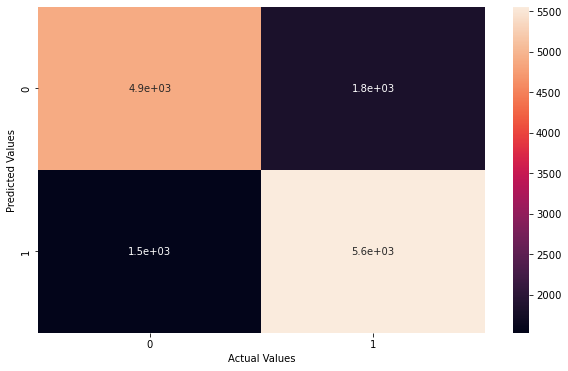

In [59]:
plt.figure(figsize=(10,6))
sns.heatmap(cm,annot=True)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

In [60]:
accuracy_score(y_test,y_pred)

0.7568780770344627

In [61]:
# Print the evaluation metrics for the dataset.
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.76      0.73      0.74      6723
         1.0       0.75      0.78      0.77      7089

    accuracy                           0.76     13812
   macro avg       0.76      0.76      0.76     13812
weighted avg       0.76      0.76      0.76     13812



In [62]:
accuracy = history.history['accuracy']
accuracy_val = history.history['val_accuracy']
loss = history.history['loss']
loss_val = history.history['val_loss']

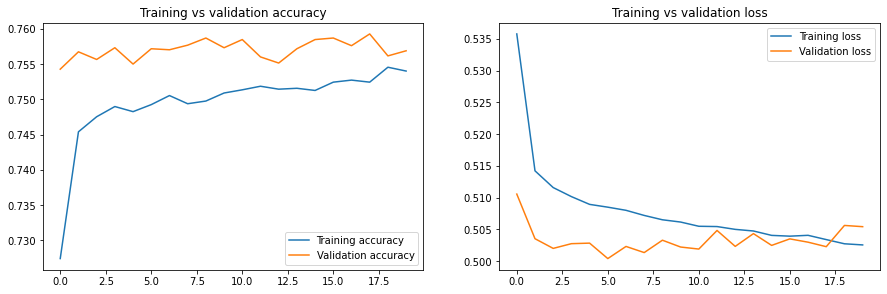

In [63]:
plt.figure(figsize=(15,10))

plt.subplot(2, 2, 1)
plt.plot(accuracy, label = "Training accuracy")
plt.plot(accuracy_val, label = "Validation accuracy")
plt.legend()
plt.title("Training vs validation accuracy")


plt.subplot(2,2,2)
plt.plot(loss, label = "Training loss")
plt.plot(loss_val, label = "Validation loss")
plt.legend()
plt.title("Training vs validation loss")

plt.show()

# LIME

In [64]:
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd

In [65]:
# Split the data into train and test data:
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size = 0.2)

In [66]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X),  
mode='classification',verbose=True,feature_names=X.columns)

In [67]:
X_test.iloc[0:5]

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
49144,1.0,0.0,1.0,35.0,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,1.0,7.0,4.0,8.0
20993,1.0,1.0,1.0,25.0,0.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,2.0,0.0,0.0,13.0,4.0,5.0
26438,1.0,1.0,1.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,2.0,1.0,0.0,1.0,0.0,8.0,2.0,5.0
63252,1.0,0.0,1.0,24.0,0.0,0.0,1.0,0.0,1.0,1.0,...,1.0,0.0,4.0,0.0,0.0,1.0,1.0,13.0,4.0,8.0
13725,0.0,0.0,1.0,28.0,1.0,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,4.0,20.0,10.0,0.0,1.0,3.0,5.0,3.0


In [68]:
Y_test.iloc[0:5]

49144    1.0
20993    0.0
26438    0.0
63252    1.0
13725    0.0
Name: Diabetes_binary, dtype: float64

In [70]:
exp1 = explainer.explain_instance(X_test.iloc[1].values,lr.predict_proba, num_features=21)
exp1.show_in_notebook(show_table=True)

Intercept 0.999999769494447
Prediction_local [0.99999957]
Right: 0.9999999978409009


In [71]:
exp2 = explainer.explain_instance(X_test.iloc[1].astype(int).values,rf.predict_proba, num_features=21)
exp2.show_in_notebook(show_table=True)

Intercept 0.8576623156560622
Prediction_local [0.74266965]
Right: 0.74


In [72]:
exp3 = explainer.explain_instance(X_test.iloc[1].astype(int).values,dt.predict_proba, num_features=21)
exp3.show_in_notebook(show_table=True)

Intercept 0.4934153624558712
Prediction_local [0.85143654]
Right: 1.0


In [73]:
exp4 = explainer.explain_instance(X_test.iloc[1].astype(int).values,ab.predict_proba, num_features=21)
exp4.show_in_notebook(show_table=True)

Intercept 0.5105150179651734
Prediction_local [0.5069633]
Right: 0.5071608274507061


In [74]:
exp5 = explainer.explain_instance(X_test.iloc[1].astype(int).values,xgb.predict_proba, num_features=21)
exp5.show_in_notebook(show_table=True)

Intercept 0.9587468121626987
Prediction_local [0.8300795]
Right: 0.8476518


In [75]:
exp6 = explainer.explain_instance(X_test.iloc[1].astype(int).values,gnb.predict_proba, num_features=21)
exp6.show_in_notebook(show_table=True)

Intercept 1.0
Prediction_local [1.]
Right: 1.0


In [76]:
exp7 = explainer.explain_instance(X_test.iloc[1].astype(int).values,knn.predict_proba, num_features=15)
exp7.show_in_notebook(show_table=True)

Intercept 0.7658542382116412
Prediction_local [0.7456985]
Right: 0.8


In [77]:
exp1.as_list()

[('BMI <= 25.00', -5.586585490089919e-07),
 ('Stroke <= 0.00', 2.7630386163100067e-07),
 ('GenHlth <= 2.00', -1.6671786245369946e-07),
 ('Age > 11.00', 1.5914145933931103e-07),
 ('0.00 < HighBP <= 1.00', 9.938852530085495e-08),
 ('0.00 < HighChol <= 1.00', 7.054798723377071e-08),
 ('Smoker <= 0.00', -5.843183214184552e-08),
 ('0.00 < PhysHlth <= 6.00', 5.626035263362548e-08),
 ('MentHlth <= 0.00', 4.931074019245897e-08),
 ('HvyAlcoholConsump <= 0.00', -4.233895417517067e-08),
 ('0.00 < Fruits <= 1.00', -3.44011507354934e-08),
 ('NoDocbcCost <= 0.00', -3.026651135008009e-08),
 ('HeartDiseaseorAttack <= 0.00', -2.587350387027904e-08),
 ('Education <= 4.00', 2.4517388929613083e-08),
 ('4.00 < Income <= 6.00', -1.0769330772706903e-08),
 ('Sex <= 0.00', -8.097520584325392e-09),
 ('DiffWalk <= 0.00', -3.957444169530931e-09),
 ('PhysActivity <= 0.00', 2.62752524325726e-09),
 ('AnyHealthcare <= 1.00', 0.0),
 ('Veggies <= 1.00', 0.0),
 ('CholCheck <= 1.00', 0.0)]

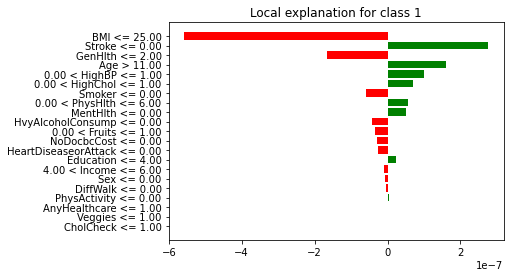

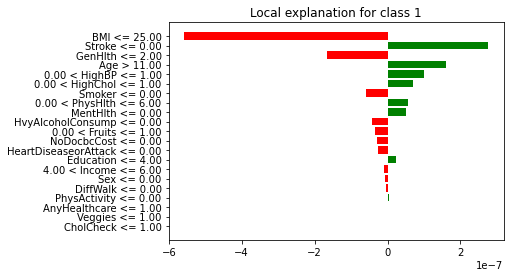

In [78]:
exp1.as_pyplot_figure()

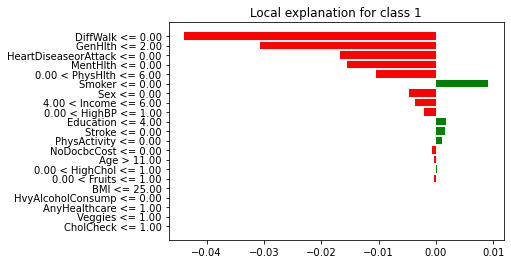

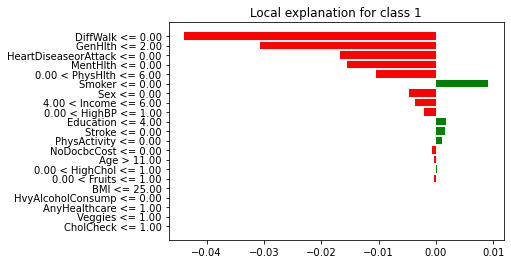

In [79]:
exp2.as_pyplot_figure()

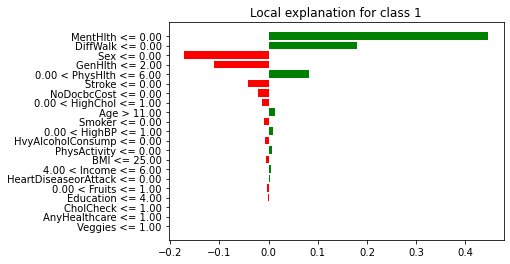

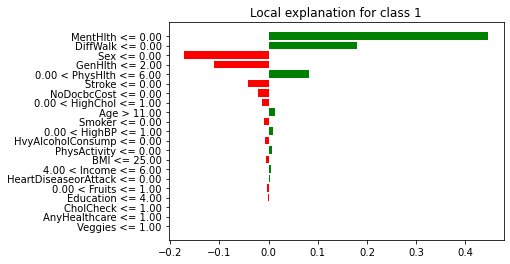

In [80]:
exp3.as_pyplot_figure()

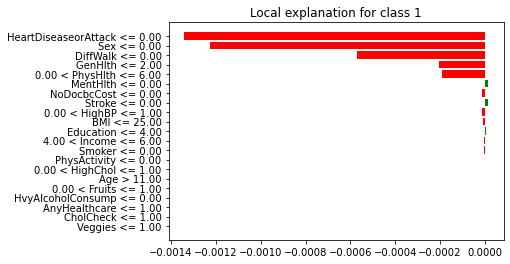

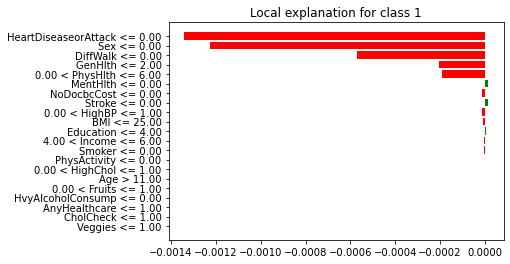

In [81]:
exp4.as_pyplot_figure()

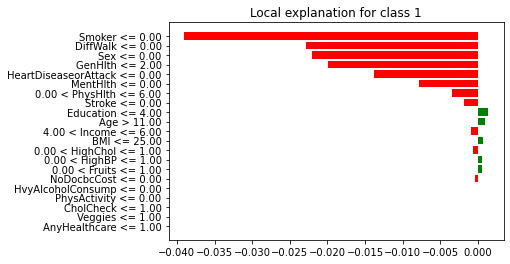

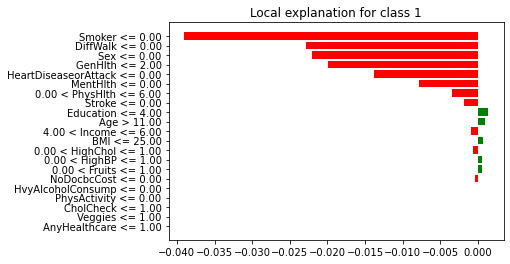

In [82]:
exp5.as_pyplot_figure()

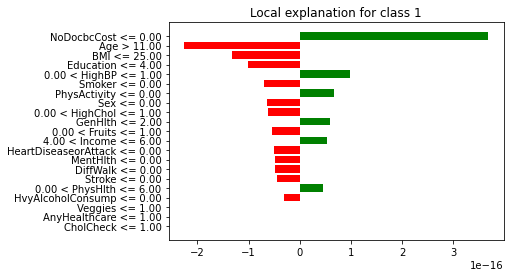

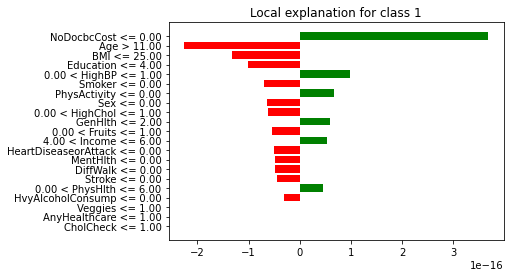

In [83]:
exp6.as_pyplot_figure()

In [84]:
exp7.as_list()

[('MentHlth <= 0.00', -0.0600520108104331),
 ('BMI <= 25.00', 0.05638401671439719),
 ('Education <= 4.00', -0.047223025791094504),
 ('GenHlth <= 2.00', -0.02663581972722121),
 ('0.00 < HighBP <= 1.00', 0.025378846824789063),
 ('Smoker <= 0.00', 0.019983685987956797),
 ('0.00 < Fruits <= 1.00', 0.018078372704294233),
 ('0.00 < PhysHlth <= 6.00', 0.009299093532210236),
 ('HeartDiseaseorAttack <= 0.00', -0.00824634190344806),
 ('NoDocbcCost <= 0.00', 0.006763115715040579),
 ('PhysActivity <= 0.00', 0.006176341144258255),
 ('DiffWalk <= 0.00', -0.0058563523161224325),
 ('Sex <= 0.00', -0.005366273423975334),
 ('HvyAlcoholConsump <= 0.00', -0.004696231497816756),
 ('0.00 < HighChol <= 1.00', -0.004143152698306873)]

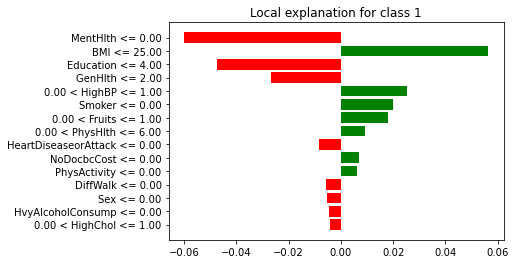

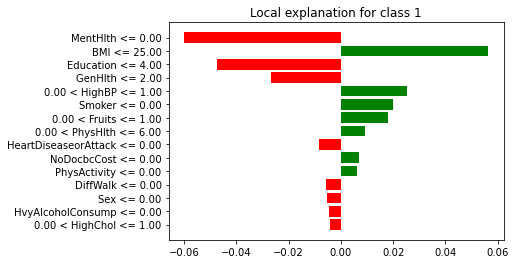

In [85]:
exp7.as_pyplot_figure()

# SHAP

In [90]:
import shap


In [91]:
shap.initjs()


100%|===================| 13806/13812 [01:43<00:00]        

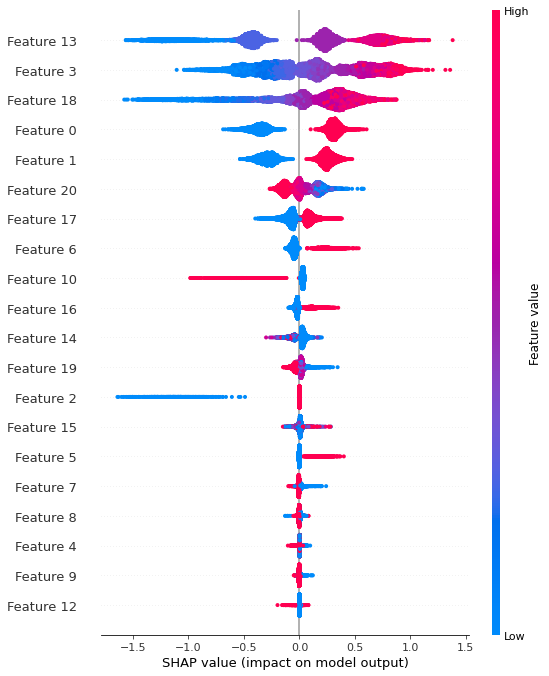

In [92]:
explainer1 = shap.TreeExplainer(xgb,x_train)
shap_values = explainer1.shap_values(x_test)
shap.summary_plot(shap_values,x_test)

In [93]:
explainer1.expected_value

-0.3318982909252327

In [94]:
#shap.force_plot(explainer1.expected_value, shap_values[1,:], x_test)

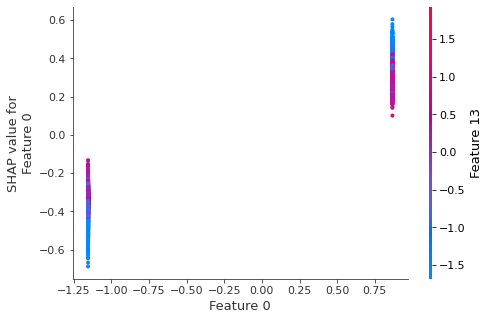

In [95]:
shap.dependence_plot(0,shap_values, x_test)



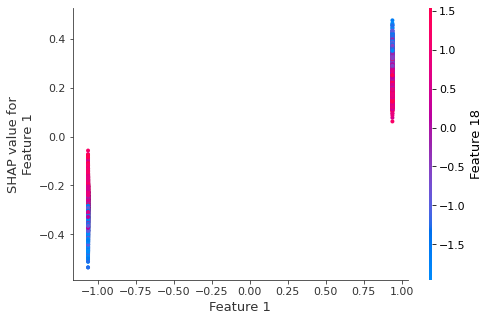

In [96]:
shap.dependence_plot(1,shap_values, x_test)

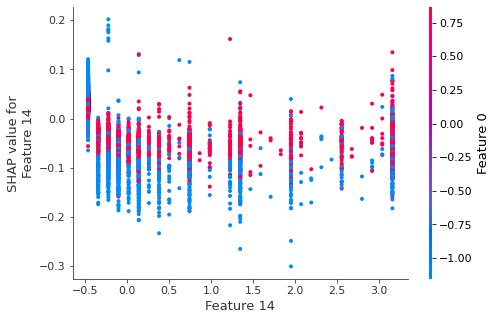

In [98]:
shap.dependence_plot(14,shap_values, x_test)

AdaBoost

In [99]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split

In [100]:
explainer2 =shap.TreeExplainer(rf,X_train)
shap_values = explainer2.shap_values(x_test)
shap.summary_plot(shap_values,x_test)

100%|===================| 27620/27624 [94:19<00:00]        

ExplainerError: Additivity check failed in TreeExplainer! Please ensure the data matrix you passed to the explainer is the same shape that the model was trained on. If your data shape is correct then please report this on GitHub. This check failed because for one of the samples the sum of the SHAP values was 0.560000, while the model output was 0.740000. If this difference is acceptable you can set check_additivity=False to disable this check.

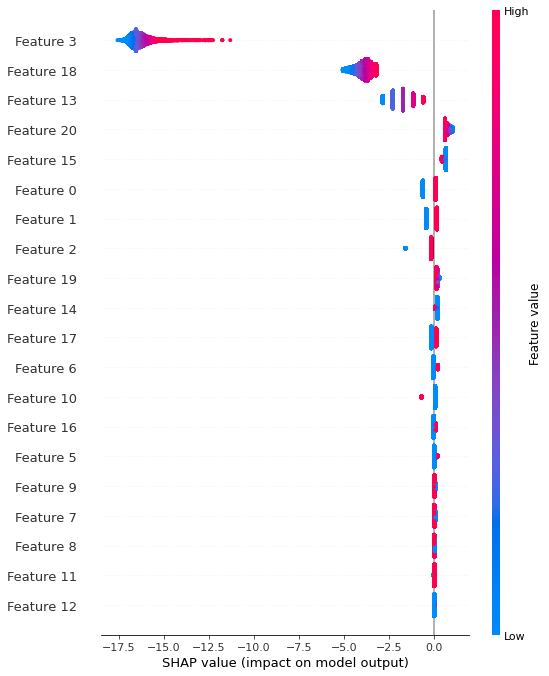

In [101]:
explainer3 =shap.Explainer(lr, X_train)
shap_values = explainer3.shap_values(x_test)
shap.summary_plot(shap_values,x_test)

In [1]:
explainer =shap.Explainer(knn, X_train)
shap_values = explainer.shap_values(x_test)
shap.summary_plot(shap_values,x_test)

NameError: name 'shap' is not defined